Import libraries

In [1]:
import matplotlib.pyplot as plt
import pydicom
import numpy as np
import cv2 as cv
import os
import skimage.segmentation as seg

Constants

In [2]:
# IMAGES_GRID_WIDTH = 6
# IMAGES_GRID_HEIGHT = 4
IMAGES_GRID_WIDTH = 8
IMAGES_GRID_HEIGHT = 7
IMAGE_PATHS = os.listdir("DICOM")

Functions

Display Images

In [3]:
def displayImages(w,h,img):
    plt.figure(figsize=(20, 30), dpi= 80, facecolor='w', edgecolor='k')
    for i in range(h):
        for j in range(w):
            if i*w+j < IMAGES_GRID_WIDTH * IMAGES_GRID_HEIGHT:
                plt.subplot(w,h,i*w+j+1)
                plt.axis('off')
                plt.imshow(img[i*w+j], cmap=plt.cm.bone)
    plt.tight_layout()
    plt.show()

Manipulate Images

In [4]:
def manipulate(img, func):
    ret = []
    for i in img:
        ret.append(func(i))
    return ret

def splitReturns(data):
    ret = [[] for i in range(len(data[0]))]
    for i in data:
        for j in range(len(i)):
            ret[j].append(i[j])
    return ret

Load DICOM File

In [5]:
def loadDicomImg(path):
    img = np.array(pydicom.read_file(path).pixel_array / 2**4).astype(np.uint8)
    return img

Preprocessing

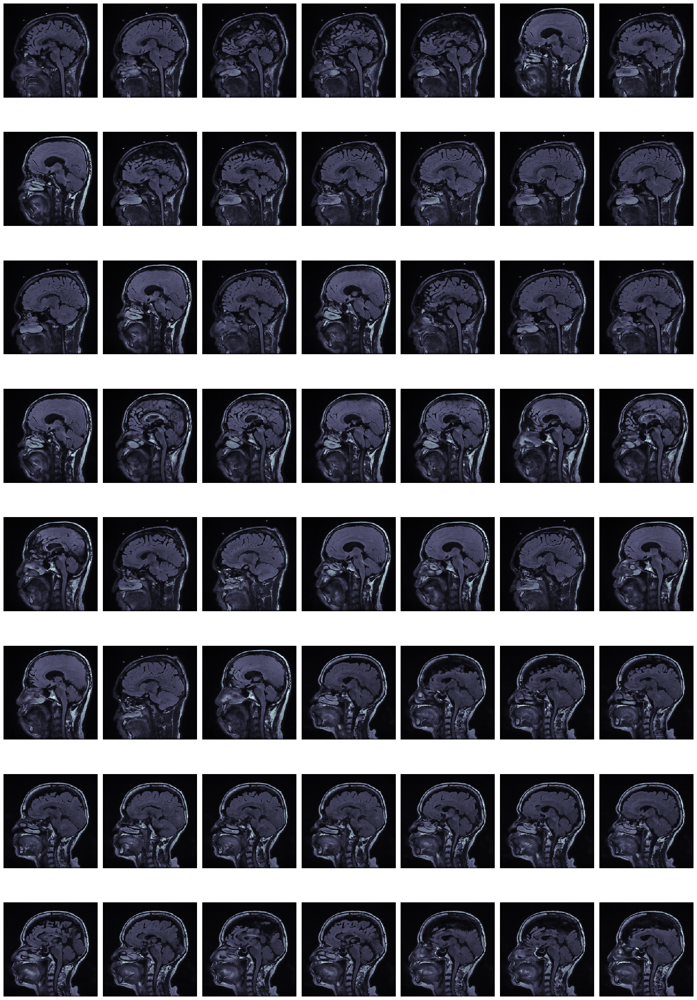

In [6]:
img = []
for i in IMAGE_PATHS:
    img.append(loadDicomImg("DICOM/"+i))
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,img)

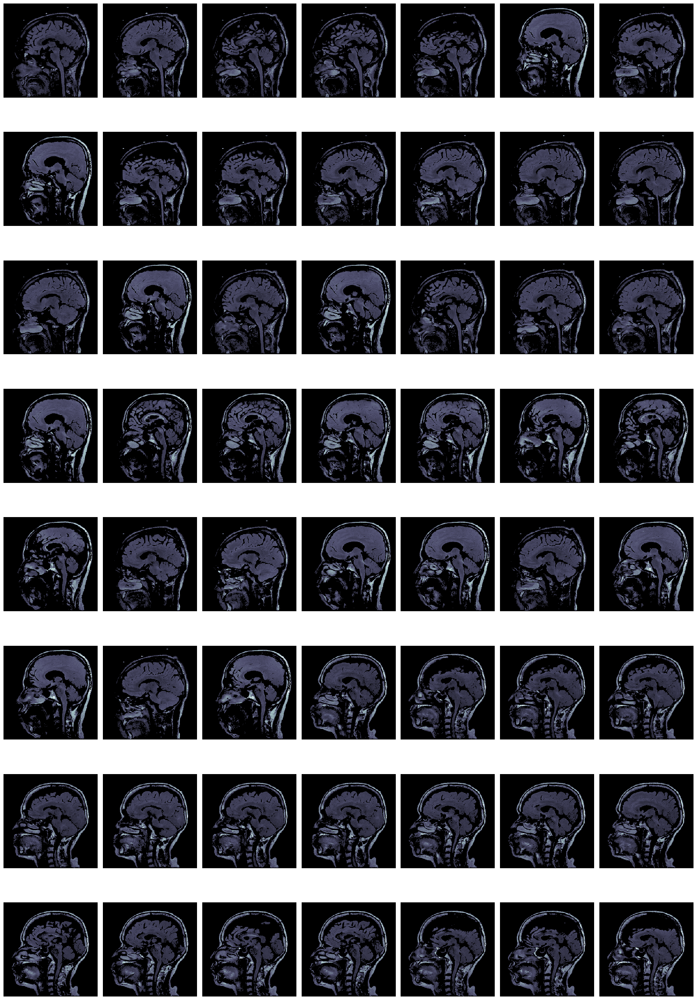

In [7]:
thresh = manipulate(img, lambda x:cv.threshold(x,0,255,cv.THRESH_TOZERO+cv.THRESH_OTSU)[1])
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,thresh)

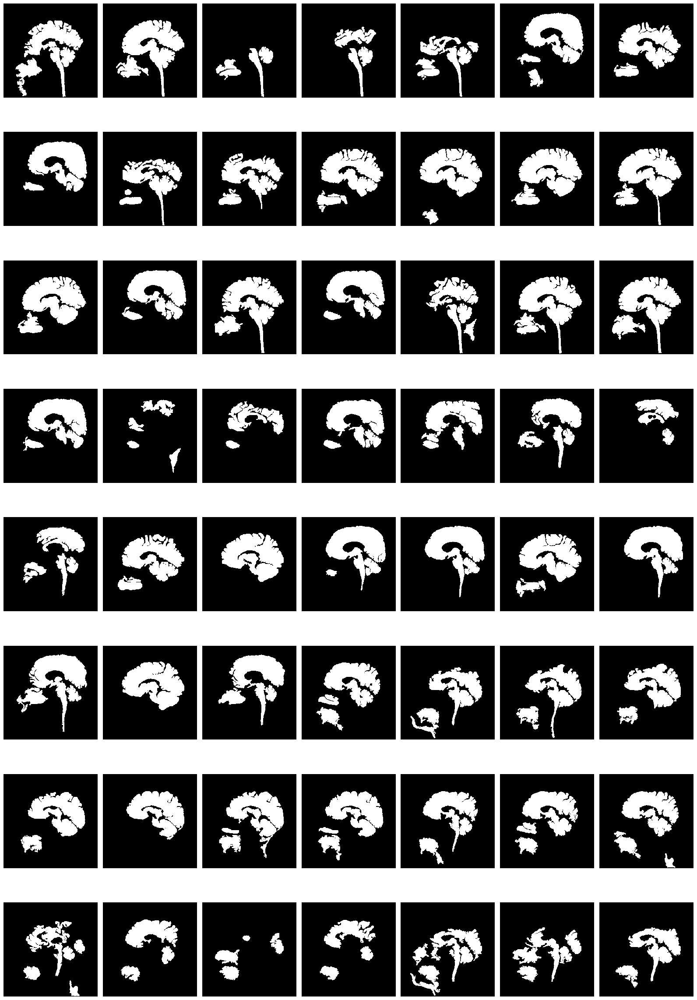

In [8]:
def filterContours(contours):
    ret = []
    for i in contours:
        if (cv.contourArea(i) + 1e-8) / (cv.arcLength(i,True) + 1e-8) > 3:
            ret.append(i)
    return ret

def extractContours(img):
    erosion_size = 1
    erosion_dst = cv.erode(img, cv.getStructuringElement(cv.MORPH_ELLIPSE, (2*erosion_size + 1, 2*erosion_size+1), (erosion_size, erosion_size)))
    cont = cv.findContours(erosion_dst, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)[1];
    cont = filterContours(cont)
    ret = np.zeros((img.shape[0], img.shape[1]), np.uint8)
    cv.drawContours(ret, cont, -1, (255,255,255), -1)
    ret = cv.dilate(ret, cv.getStructuringElement(cv.MORPH_ELLIPSE, (2*erosion_size + 1, 2*erosion_size+1), (erosion_size, erosion_size)))
    return ret
cont = manipulate(thresh, extractContours)
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,cont)

#cont = manipulate(imgHisteq, lambda x:cv.drawContours(np.zeros((x.shape[0], x.shape[1]), np.uint8), cv.findContours(x, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)[1], -1, (0,255,0), 3))

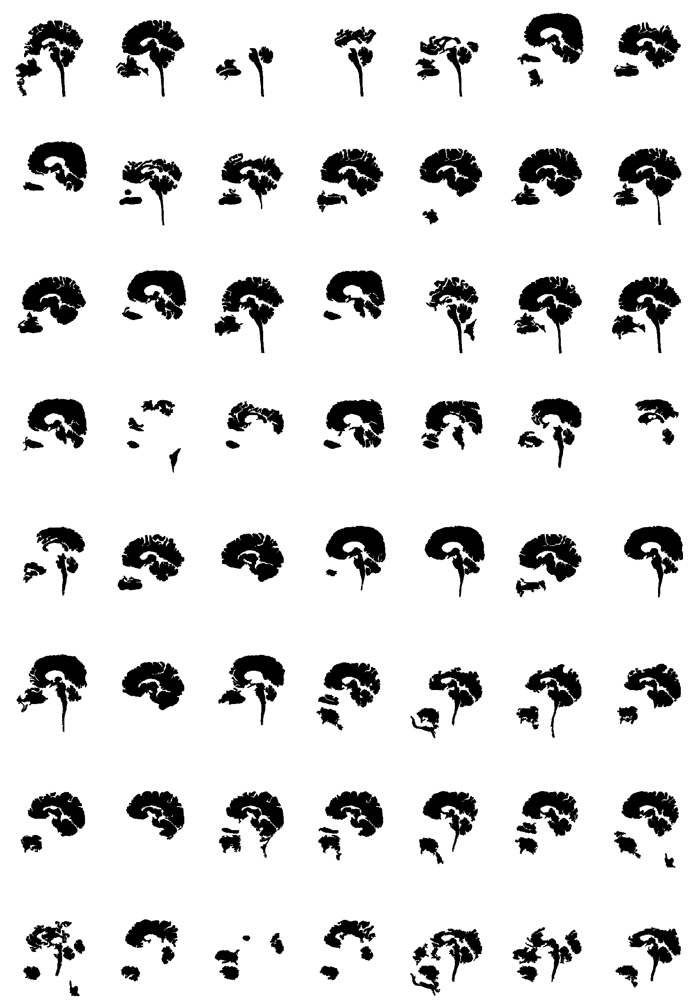

In [9]:
invMask = manipulate(cont,cv.bitwise_not)
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,invMask)

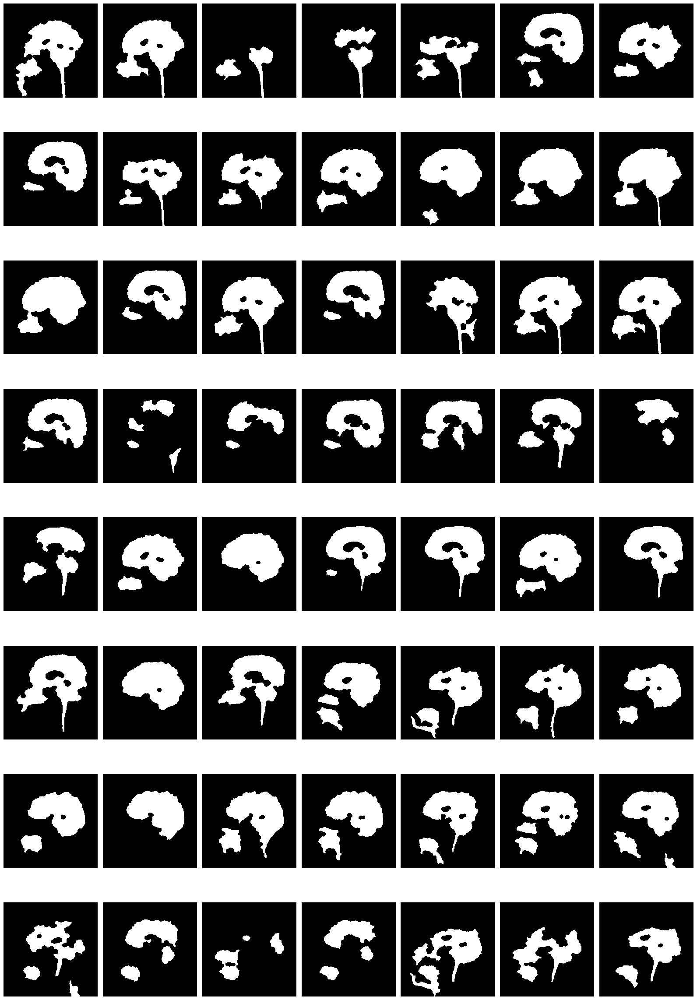

In [10]:
dilation_size = 5
contClose = manipulate(cont,lambda x:cv.dilate(x, cv.getStructuringElement(cv.MORPH_ELLIPSE, (2*dilation_size + 1, 2*dilation_size+1), (dilation_size, dilation_size))))
contClose = manipulate(contClose,lambda x:cv.erode(x, cv.getStructuringElement(cv.MORPH_ELLIPSE, (2*dilation_size + 1, 2*dilation_size+1), (dilation_size, dilation_size))))
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,contClose)

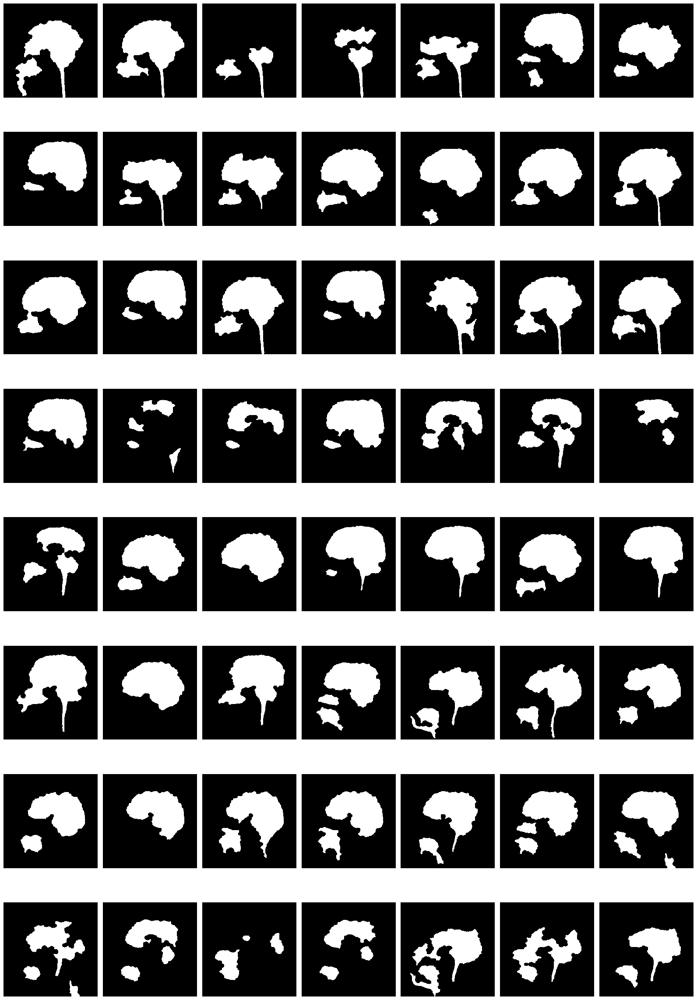

In [11]:
def imfill(img):
    imgCopy = img.copy()
    h, w = imgCopy.shape
    mask = np.zeros((h+2, w+2), np.uint8)
    cv.floodFill(imgCopy, mask, (0,0), 255);
    imgCopyInv = cv.bitwise_not(imgCopy)
    ret = img | imgCopyInv
    return ret
contFill = manipulate(contClose,imfill)
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,contFill)

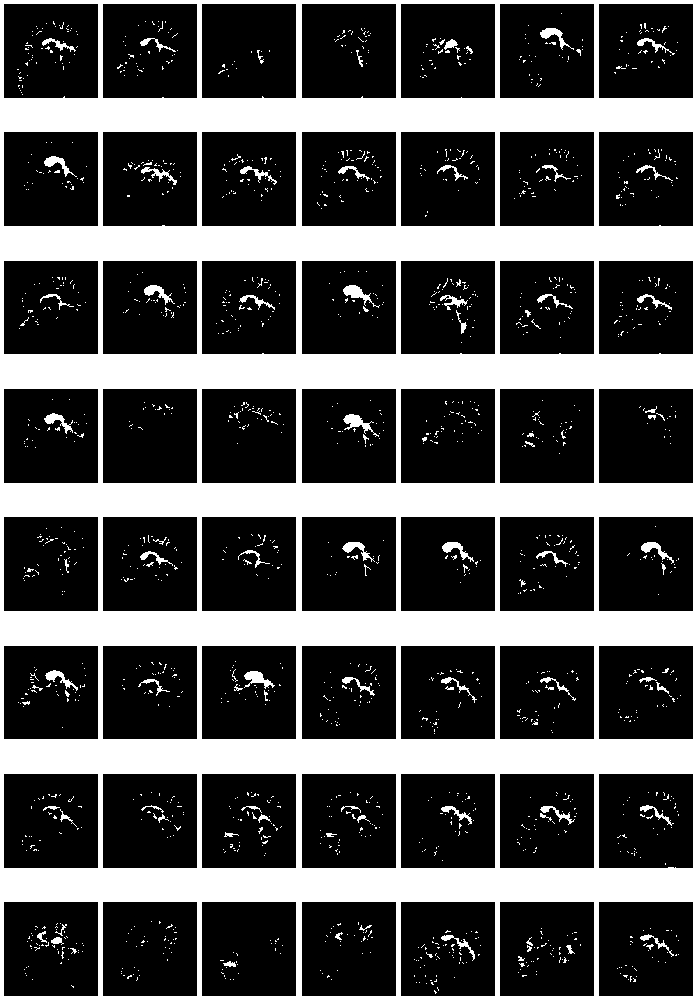

In [12]:
holes = manipulate(zip(contFill,invMask), lambda x: cv.bitwise_and(x[0],x[1])) 
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,holes)

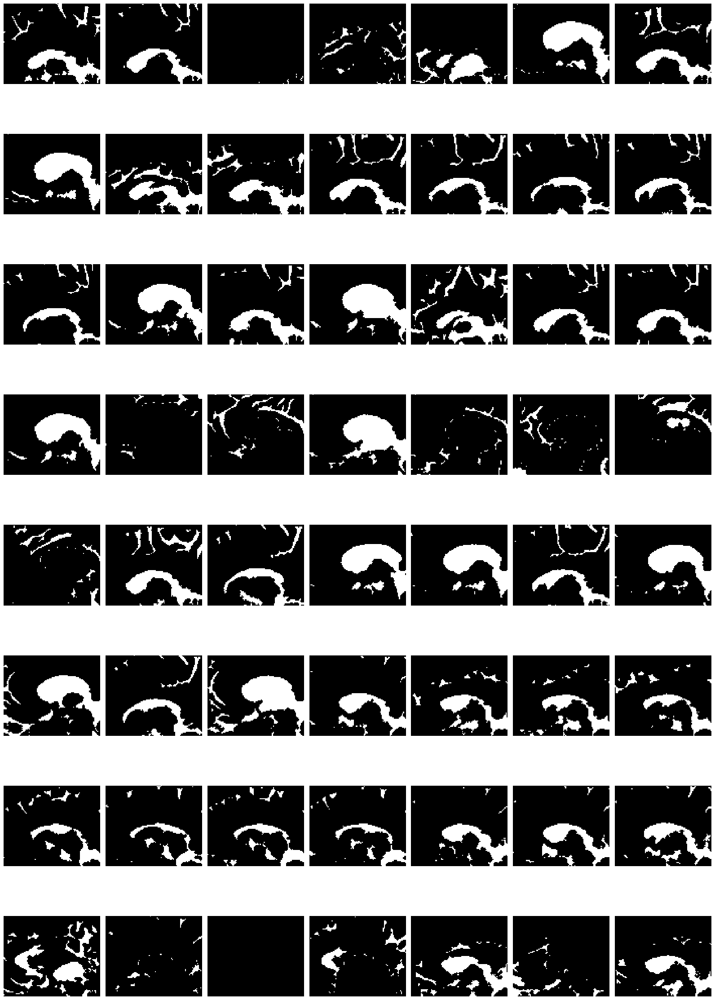

In [13]:
croppedHoles = manipulate(holes, lambda x:x[48:128][:,80:176])
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,croppedHoles)

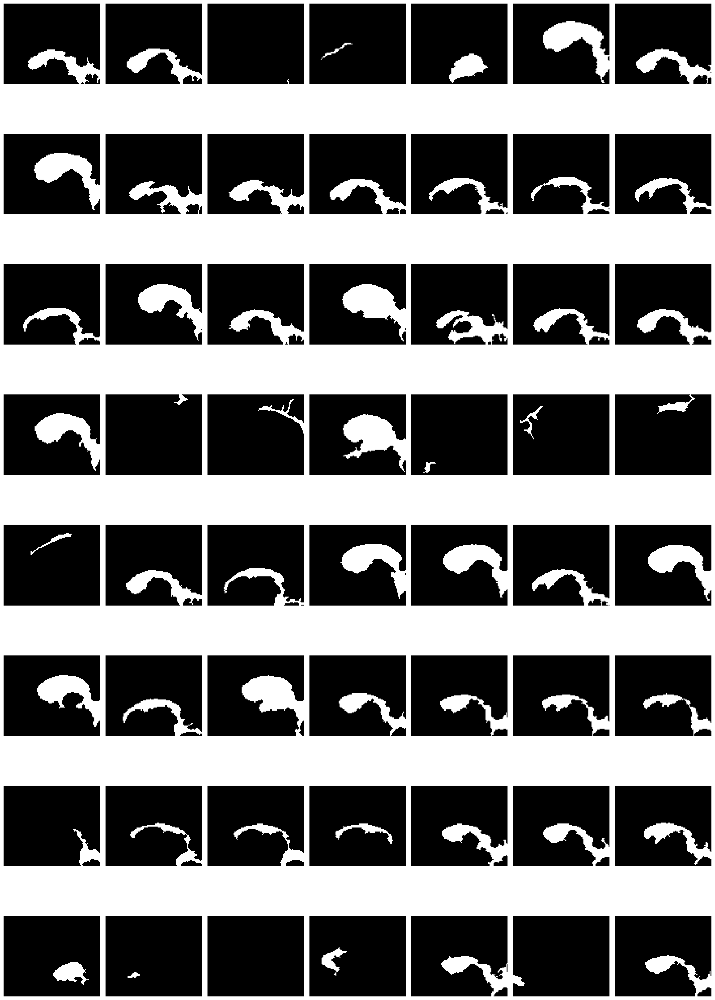

In [14]:
def extractContours2(img):
    cont = cv.findContours(img, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)[1];
    if len(cont)==0:
        return np.zeros((img.shape[0], img.shape[1]), np.uint8)
    cont = max(cont, key=cv.contourArea)
    ret = np.zeros((img.shape[0], img.shape[1]), np.uint8)
    cv.drawContours(ret, [cont], -1, (255,255,255), -1)
    return ret
contHoles = manipulate(croppedHoles, extractContours2)
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,contHoles)

#cont = manipulate(imgHisteq, lambda x:cv.drawContours(np.zeros((x.shape[0], x.shape[1]), np.uint8), cv.findContours(x, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)[1], -1, (0,255,0), 3))

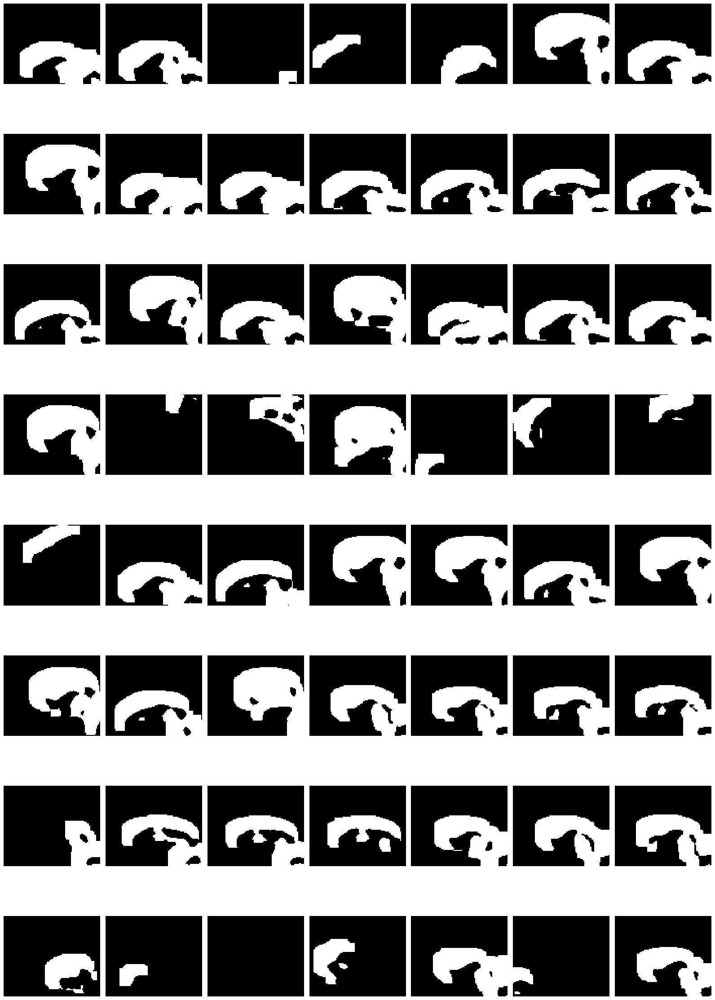

In [15]:
def dilateNoDown(img):
    size = 17
    y = int((size-1)/2)+1
    kernel = np.array([[-2]*(size-y) + [1]*y] * (size-y) + [[1]*size]*y)
    ret = cv.filter2D(img,-1,kernel)
    return ret
dilateHoles = manipulate(contHoles, dilateNoDown)
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,dilateHoles)

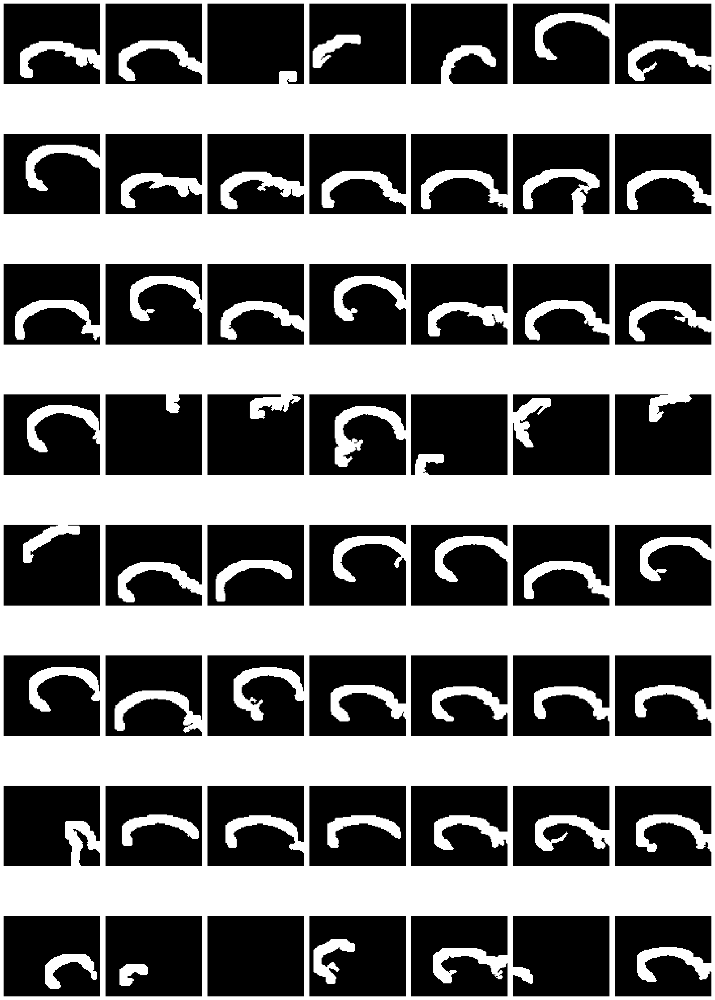

In [16]:
def extractContours3(img):
    erosion_size = 1
    erosion_dst = cv.erode(img, cv.getStructuringElement(cv.MORPH_ELLIPSE, (2*erosion_size + 1, 2*erosion_size+1), (erosion_size, erosion_size)))
    cont = cv.findContours(erosion_dst, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)[1];
    if len(cont)==0:
        return np.zeros((img.shape[0], img.shape[1]), np.uint8)
    cont = max(cont, key=cv.contourArea)
    ret = np.zeros((img.shape[0], img.shape[1]), np.uint8)
    cv.drawContours(ret, [cont], -1, (255,255,255), -1)
    ret = cv.dilate(ret, cv.getStructuringElement(cv.MORPH_ELLIPSE, (2*erosion_size + 1, 2*erosion_size+1), (erosion_size, erosion_size)))
    return ret
ccMaskSmall = manipulate(zip(contHoles,dilateHoles), lambda x: extractContours3(x[1]-x[0]))
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,ccMaskSmall)

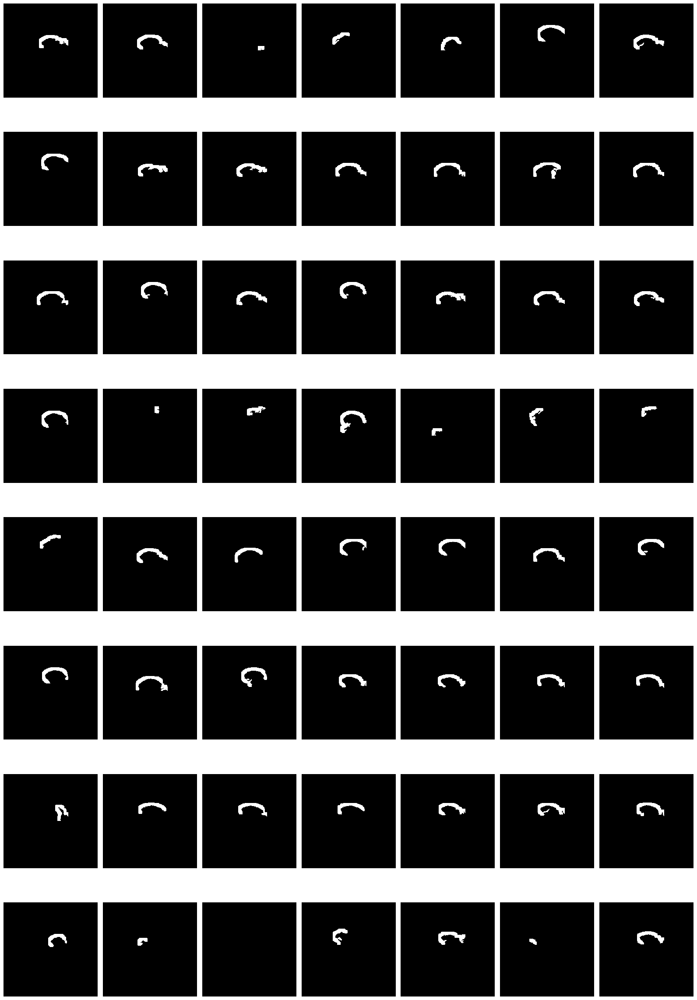

In [17]:
#x[48:128][:,80:176]
def uncrop(img):
    return np.array(
        [[0]*256] * 48 +
        [[0]*80 + list(i) + [0]*80 for i in img] +
        [[0]*256] * 128
    ).astype(np.uint8)
ccMask = manipulate(ccMaskSmall, uncrop)
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,ccMask)

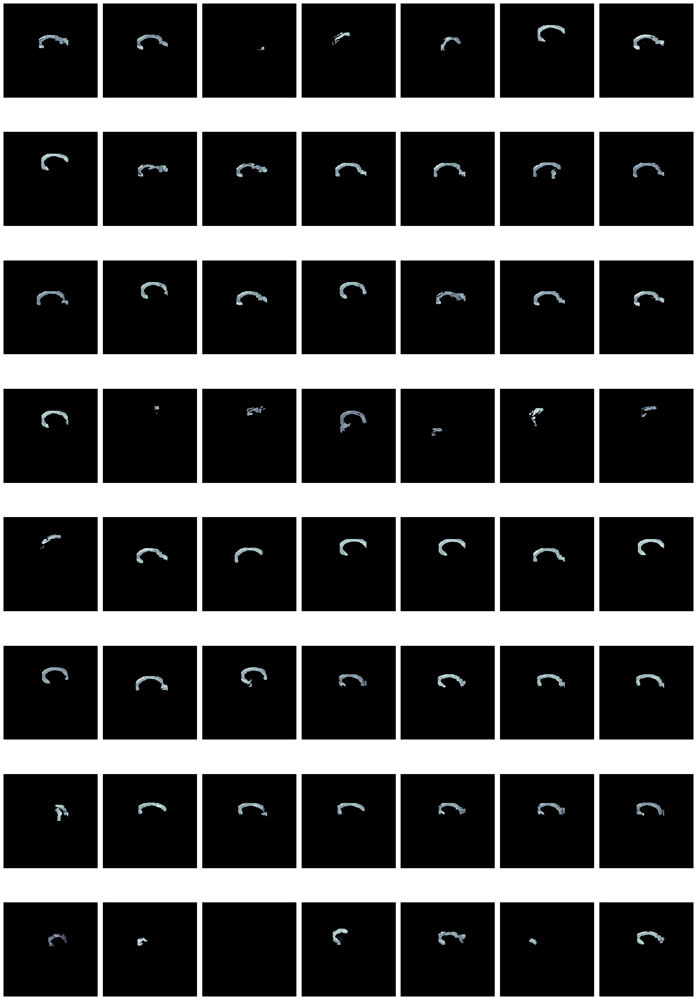

In [18]:
cc = manipulate(zip(thresh,ccMask), lambda x: cv.bitwise_and(x[0],x[1])) 
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,cc)

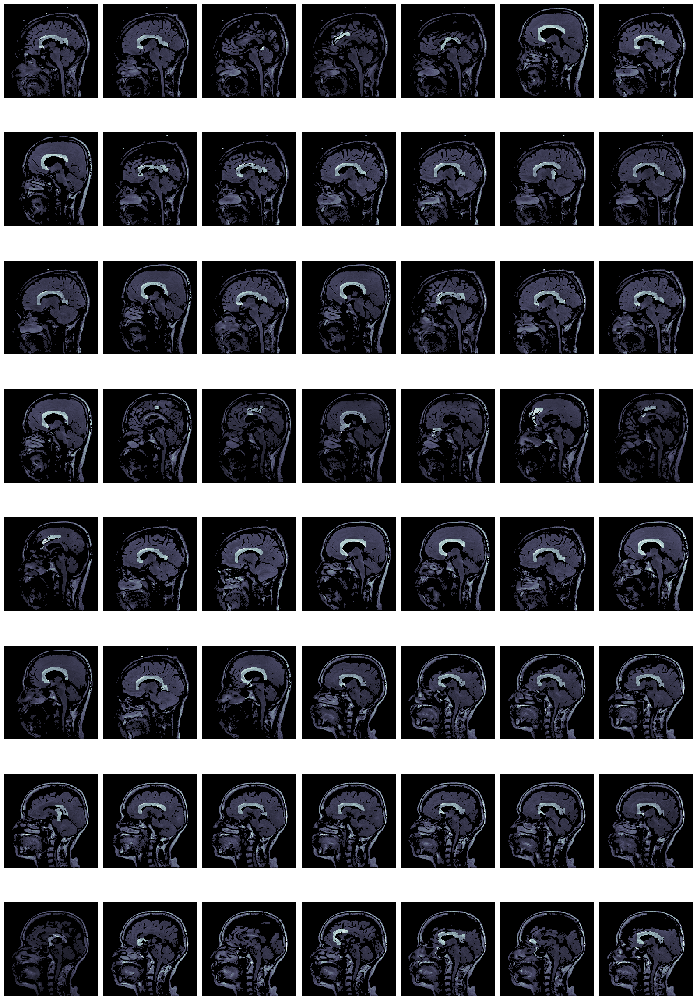

In [19]:
lastPlease = manipulate(zip(thresh,cc), lambda x: x[0]+x[1]/3*5) 
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,lastPlease)

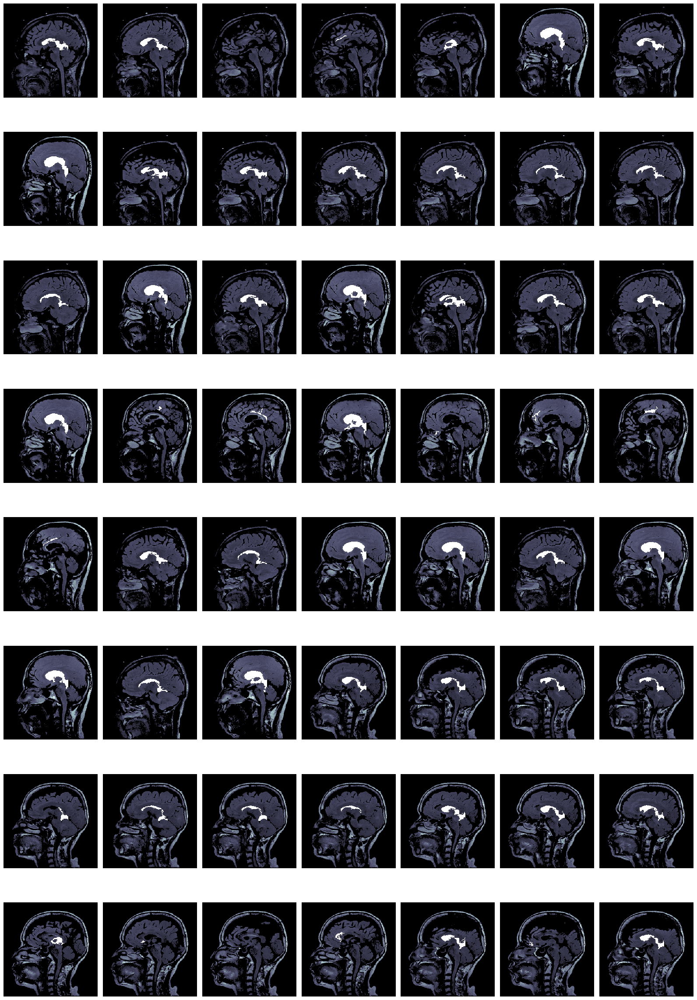

In [50]:
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,manipulate(zip(contHoles,thresh),lambda x: uncrop(x[0])+x[1]))

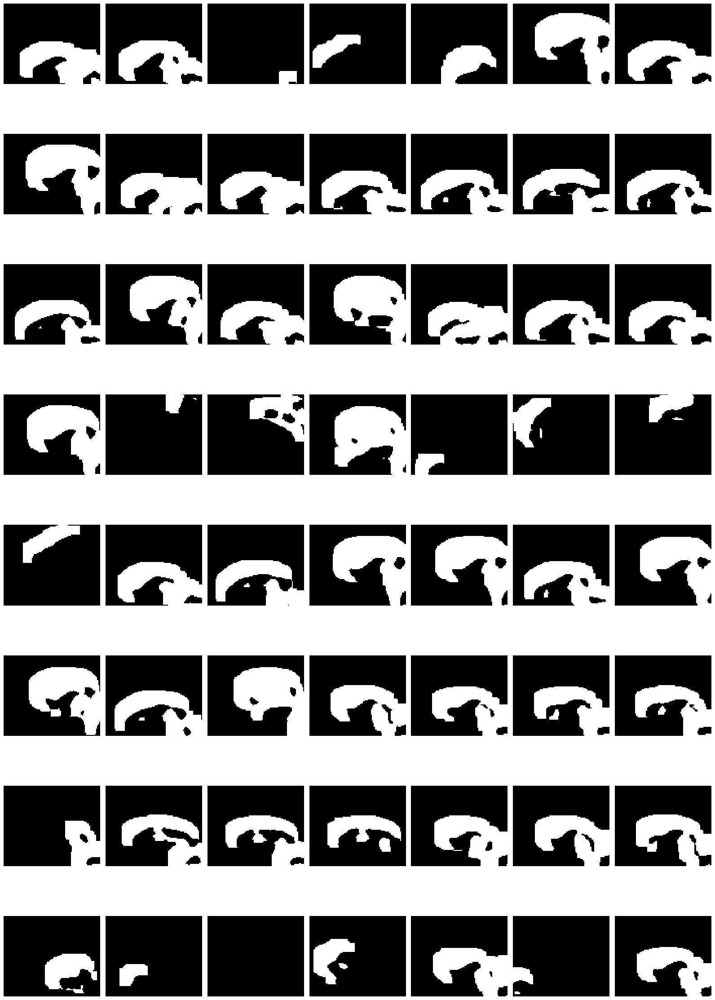

In [56]:
def dilateOnlyDown(img):
    size = 21
    y = int((size-1)/2)+1
    x1 = int((size-y)/2)
    x2 = size-y-x1
    kernel = np.array([[-1] * x1 + [3] * y + [-1] * x2] * (size - y) + [[-1] * size] * y)
    ret = cv.filter2D(img,-1,kernel)
    return ret
dilateHoles2 = manipulate(contHoles, dilateOnlyDown)
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,dilateHoles)

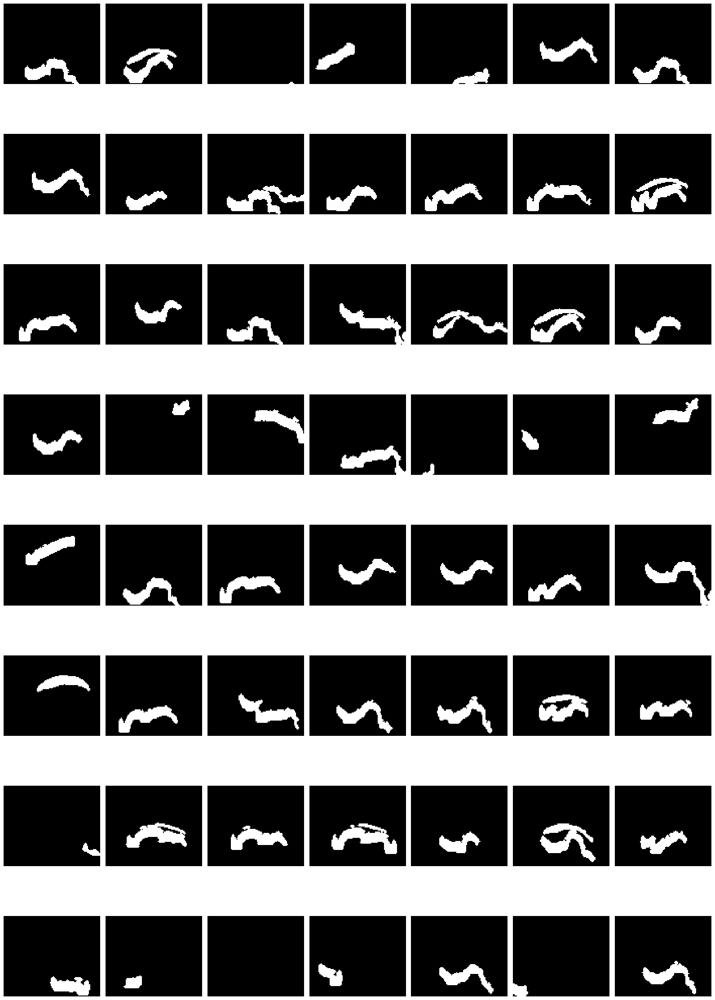

In [57]:
# def extractContours3(img):
#     erosion_size = 1
#     erosion_dst = cv.erode(img, cv.getStructuringElement(cv.MORPH_ELLIPSE, (2*erosion_size + 1, 2*erosion_size+1), (erosion_size, erosion_size)))
#     cont = cv.findContours(erosion_dst, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)[1];
#     if len(cont)==0:
#         return np.zeros((img.shape[0], img.shape[1]), np.uint8)
#     cont = max(cont, key=cv.contourArea)
#     ret = np.zeros((img.shape[0], img.shape[1]), np.uint8)
#     cv.drawContours(ret, [cont], -1, (255,255,255), -1)
#     ret = cv.dilate(ret, cv.getStructuringElement(cv.MORPH_ELLIPSE, (2*erosion_size + 1, 2*erosion_size+1), (erosion_size, erosion_size)))
#     return ret

fxMaskSmall = manipulate(zip(contHoles,dilateHoles2), lambda x: extractContours3(x[1]-x[0]))
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,fxMaskSmall)

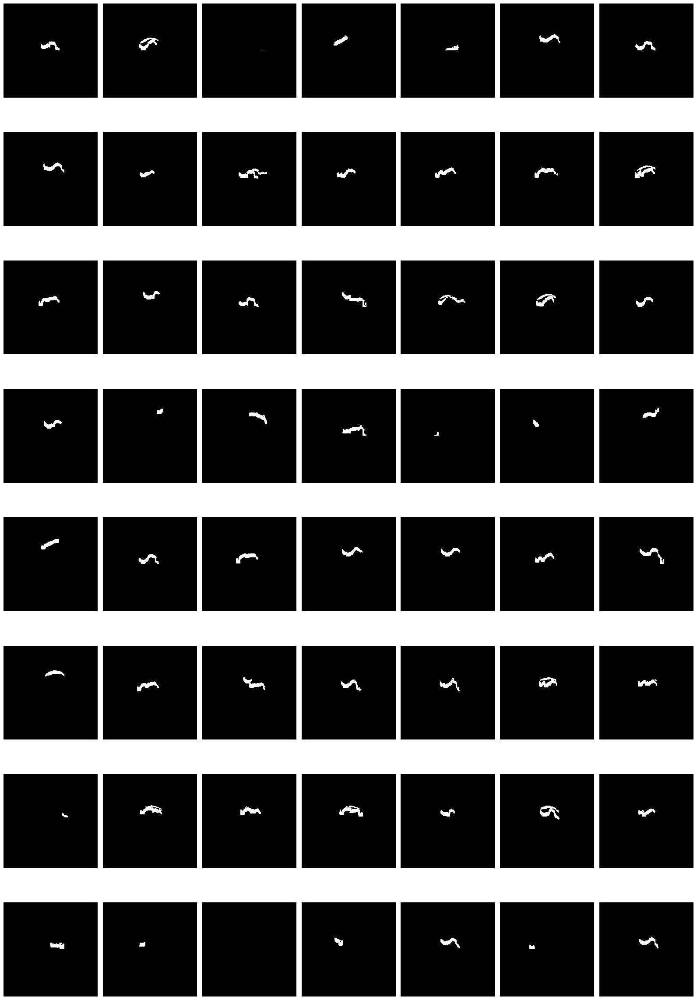

In [58]:
#x[48:128][:,80:176]
# def uncrop(img):
#     return np.array(
#         [[0]*256] * 48 +
#         [[0]*80 + list(i) + [0]*80 for i in img] +
#         [[0]*256] * 128
#     ).astype(np.uint8)
fxMask = manipulate(fxMaskSmall, uncrop)
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,fxMask)

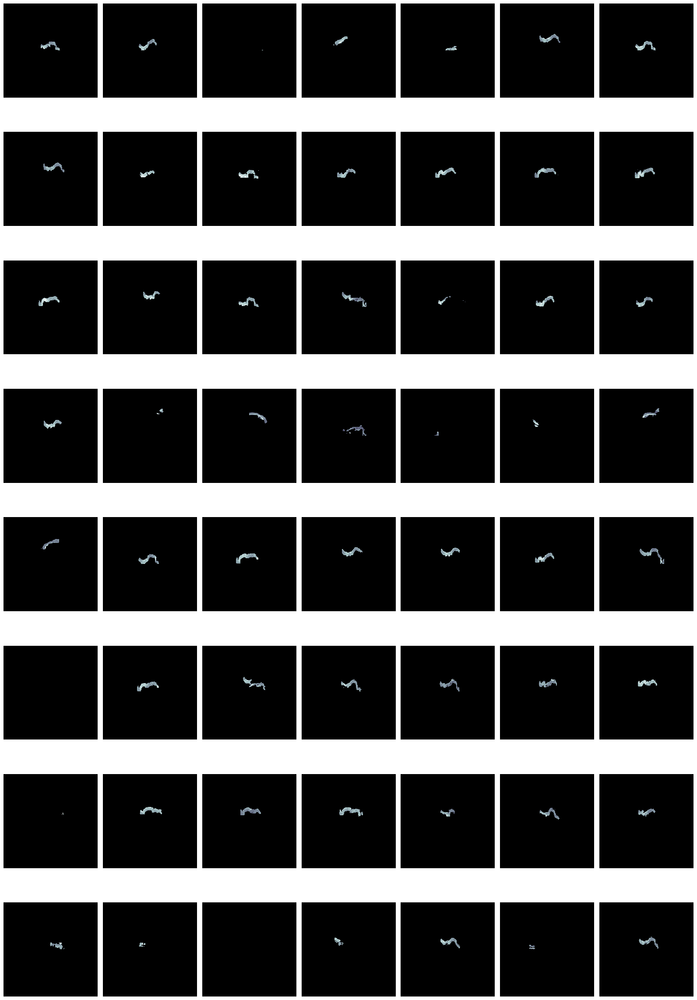

In [63]:
fx = manipulate(zip(thresh,fxMask), lambda x: cv.bitwise_and(x[0],x[1])) 
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,fx)

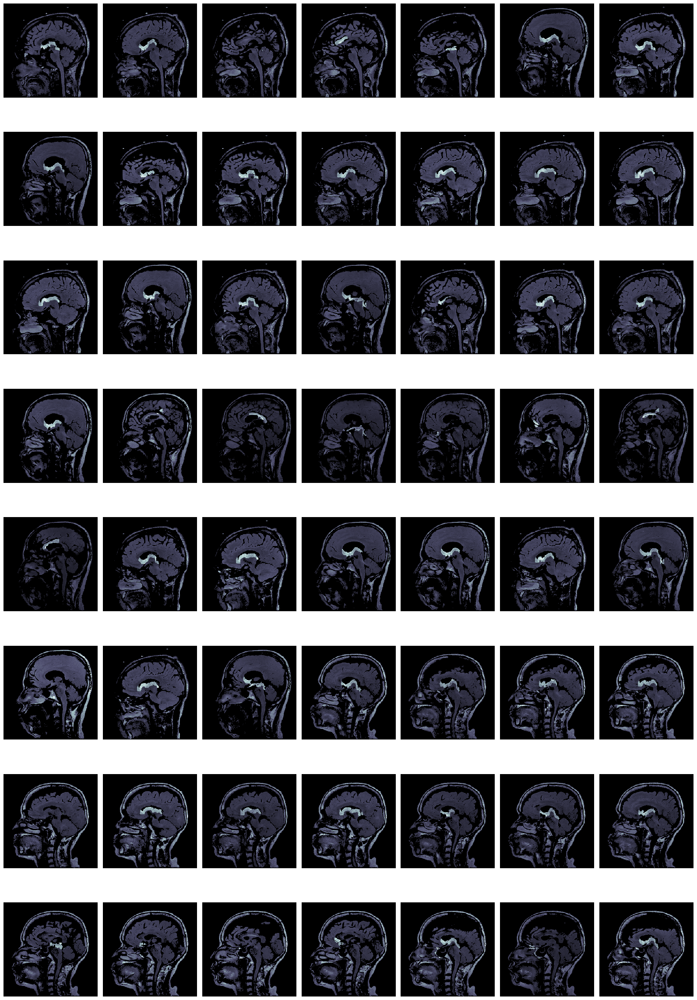

In [64]:
lastPlease2 = manipulate(zip(thresh,fx), lambda x: x[0]+x[1]/3*5) 
displayImages(IMAGES_GRID_WIDTH,IMAGES_GRID_HEIGHT,lastPlease2)